In [48]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
import math
from scipy import ndimage

# from utilities import *
warnings.filterwarnings('ignore') 
# Consider aesthetics
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['axes.axisbelow'] = True
plt.rcParams.update({'font.size': 15})

# Utility Functions


To reduce the amount of code required for frequently performed tasks in this notebook, we have defined four utility functions:

1. `calculate_channel_hist(img, grayscale = False)`: calculates the histogram of each color channel in an image or the intensity histogram if `grayscale` is `True`.
2. `show_image(img,title, grayscale = False)`: displays an image with a given title and color mode. If `grayscale` is `False`, the image is converted from BGR to RGB color mode before display.
3. `compare_images(img1, img2,titles=["Current Image","Target"], grayscale = "None")`: compares two images side by side and displays them with given titles. The color mode of each image can be specified using the `grayscale` argument.
4. `plot_channel_histograms(img, titles = [], grayscale = False)`: plots the histograms and cumulative distribution functions (CDFs) of each color channel in an image or the intensity histogram if `grayscale` is `True`.
5. `show_channel_images(img,titles)`: displays the three color channels of an image side by side with given titles.


In [49]:
def calculate_channel_hist(img, grayscale = False):
  if grayscale:
    intensity = cv2.calcHist([img],[0],None,[256],[0,256])
    return intensity
  else:
    channel1 = cv2.calcHist([img[:,:,0]],[0],None,[256],[0,256])
    channel2 = cv2.calcHist([img[:,:,1]],[0],None,[256],[0,256])
    channel3 = cv2.calcHist([img[:,:,2]],[0],None,[256],[0,256])
    return channel1,channel2,channel3

def show_image(img,title, grayscale = False):
  if not grayscale:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.figure(figsize = (10,6))
  plt.imshow(img, cmap ="gray")
  plt.axis('off')
  plt.title(title)
  plt.show()

def compare_images(img1, img2,titles=["Current Image","Target"], grayscale = "None"):
  if grayscale == "all":
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
  elif grayscale == "first":
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
  elif grayscale == "second":
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
  elif grayscale == "None":
    pass
  else:
    raise(ValueError("Invalid argument"))
  fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))
  axs[0].imshow(img1,cmap = "gray")
  axs[0].axis('off')
  axs[0].set_title(titles[0])
  axs[1].imshow(img2, cmap = "gray")
  axs[1].axis('off')
  axs[1].set_title(titles[1])
  fig.show()

def plot_channel_histograms(img, titles = [], grayscale = False):
  if grayscale:
    intensity = calculate_channel_hist(img,grayscale)
    intensity_cdf = np.cumsum(intensity)
    intensity_cdf_normalized = intensity_cdf * np.max(intensity)/ intensity_cdf.max()
    plt.plot(intensity, label = "histogram")
    plt.xticks(np.arange(0,270,15),rotation = 90)
    plt.plot(intensity_cdf_normalized, label = "CDF")
    plt.legend(fontsize = 15)
    plt.grid(True)
    
  else:
    channel1, channel2, channel3 = calculate_channel_hist(img,grayscale)
    # Find the cdfs 
    channel1_cdf = channel1.cumsum()
    channel2_cdf = channel2.cumsum()
    channel3_cdf = channel3.cumsum()
    # Normalize them
    cdf_normalized1 = channel1_cdf * channel1.max()/ channel1_cdf.max()
    cdf_normalized2 = channel2_cdf * channel2.max()/ channel2_cdf.max()
    cdf_normalized3 = channel3_cdf * channel3.max()/ channel3_cdf.max()
    fig, axs = plt.subplots(1, 3, figsize=(14.38, 5))
    fig.tight_layout()
    axs[0].plot(channel1, label = "histogram")
    axs[0].plot(cdf_normalized1, label = "CDF")
    axs[0].legend(fontsize = 15)
    axs[0].grid(True)
    axs[0].set_title(titles[0])
    axs[1].plot(channel2, label = "histogram")
    axs[1].plot(cdf_normalized2, label = "CDF")
    axs[1].legend(fontsize = 15)
    axs[1].set_title(titles[1])
    axs[1].grid(True)# rotate x-axis labels by 90 degrees
    axs[2].plot(channel3, label = "histogram")
    axs[2].plot(cdf_normalized3, label = "CDF")
    axs[2].legend(fontsize = 15)
    axs[2].grid(True)
    axs[2].set_title(titles[2])
    for i in range(3):
      axs[i].set_xticks(np.arange(0,265,15))
      axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90)
    fig.show()

def show_channel_images(img,titles):
  fig, axs = plt.subplots(1, 3, figsize=(15, 5))
  fig.tight_layout()
  im0 = axs[0].imshow(img[:,:,0], cmap ="gray")
  axs[0].axis('off')
  axs[0].set_title(titles[0])
  fig.colorbar(im0, ax=axs[0])
  im1 =axs[1].imshow(img[:,:,1], cmap ="gray")
  axs[1].set_title(titles[1])
  axs[1].axis('off')
  fig.colorbar(im1, ax=axs[1])
  im2 = axs[2].imshow(img[:,:,2], cmap ="gray")
  axs[2].set_title(titles[2])
  axs[2].axis('off')
  fig.colorbar(im2, ax=axs[2])
  fig.show()


---
---


# **Exercise 1**

a) Explain the impact of the following transformation function on a grayscale image, in terms
of intensity values and brightness.

b) Verify your answer by a applying the transformation on an image of your choice (include
input/output images in your answer)


## _Solution_

In the context of grayscale images, the values of pixels range from $0$ to $255$, since grayscale images are single channel. Both intensity and brightness correspond to these pixel values with $0$ being the lowest intensity/brightness (black) and $255$ being the highest intensity/brightness (white).

The showcased transformation function quantizes the grayscale pixel values into eight bins, which groups similar values together by mapping them to a smaller set of discrete values following this function:

$$
\begin{equation}
f(x) = \begin{cases}
10 & 0 \leq x < 30 \\
20 & 30 \leq x < 60 \\
50 & 60 \leq x < 90 \\
70 & 90 \leq x < 120 \\
100 & 120 \leq x < 160 \\
140 & 160 \leq x < 190 \\
180 & 190 \leq x < 220 \\
200 & 220 \leq x \leq 255 \
\end{cases}
\end{equation}
$$

The values of the eight bins are overall lower in intensity/brightness than the range of the values they quantize. This means that the image will overall appear darker. Additionally details in intensity/brightness of the original image will be lost since pixles that differ $\approx 30$ in intensity/brightness will be assigned the same lower intensity/brightness value.


The first photo of the moon is selected to showcase this transformation:


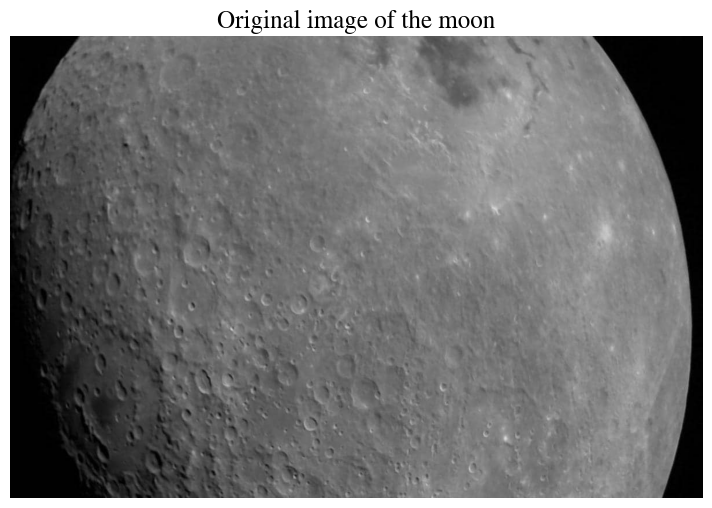

In [50]:
img1 = cv2.imread("First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg")
show_image(img1,"Original image of the moon",grayscale = True)

We define the function `quantize_intensity` which takes an input image and quantizes piexel values in bins as described above.


In [51]:
# Apply the tansformation via the following function  
def quantize_intensity(image):
  image[(image >= 0) & (image < 30)] = 10
  image[(image >= 30) & (image < 60)] = 20
  image[(image >= 60) & (image < 90)] = 50
  image[(image >= 90) & (image < 120)] = 70
  image[(image >= 120) & (image < 160)] = 100
  image[(image >= 160) & (image < 190)] = 140
  image[(image >= 190) & (image < 220)] = 180
  image[(image >= 220) & (image < 255)] = 200
  return image

As we can see, the limited range of intensity/brightness and the increase of contrast it produces is evident.


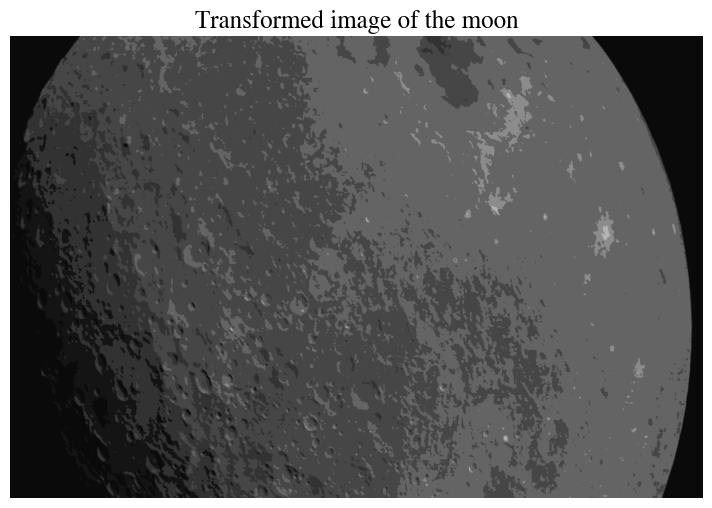

In [52]:
transformed_img1 = quantize_intensity(img1)
show_image(transformed_img1,"Transformed image of the moon", grayscale = True)

---
---


# **Exercise 2**

Propose a method for enhancing the image `“nature_dark_forest.jpg”` in terms of the
perceived light and color.


## _Solution_


The original image is presented below.


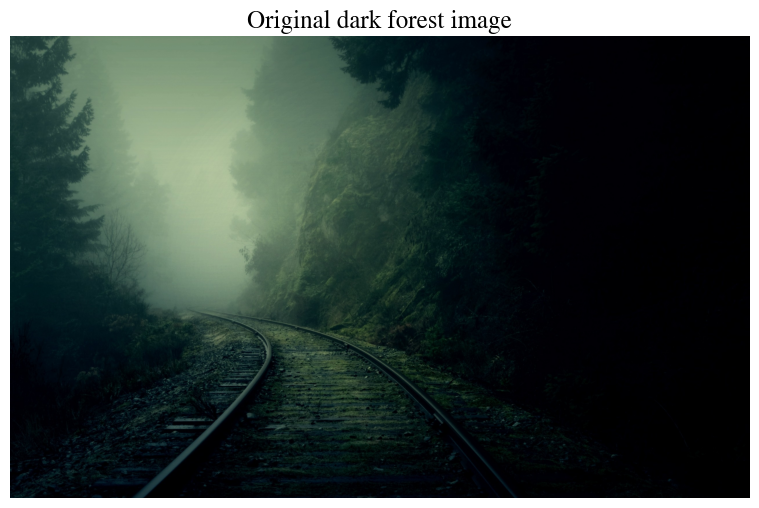

In [53]:
img2 = cv2.imread("nature_dark_forest.jpg")
show_image(img2,"Original dark forest image")

From the image above its evident that color cast exist since the light does appear natural but tinted. Thus we coade a function aims to adjust the color balance of an input image so that the colors appear more natural and balanced. It uses the mean values of the blue, green, and red channels to determine the necessary adjustments, which are then applied using a scaling factor before merging the channels back together to produce the corrected image.


In [54]:
def color_correct(img):
  b, g, r = cv2.split(img)
  b_mean = cv2.mean(b)[0]
  g_mean= cv2.mean(g)[0]
  r_mean= cv2.mean(r)[0]
  max_avg = max(b_mean, g_mean, r_mean)
  b_scale = max_avg / b_mean
  g_scale = max_avg / g_mean
  r_scale = max_avg / r_mean
  b = cv2.convertScaleAbs(b, alpha=b_scale)
  g = cv2.convertScaleAbs(g, alpha=g_scale)
  r = cv2.convertScaleAbs(r, alpha=r_scale)
  img = cv2.merge((b, g, r))
  return img


Notice how the tint was removed and the lighting appears more natural, however the image still appears dark.


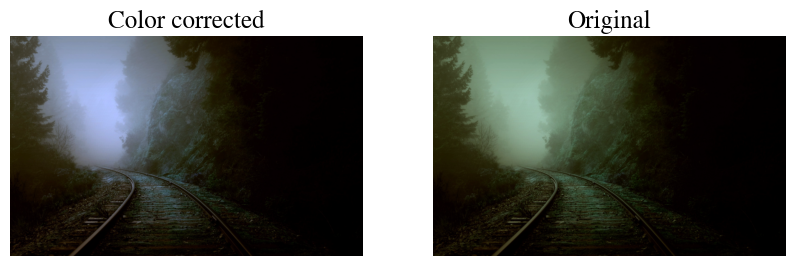

In [55]:
img2_color_corrected = color_correct(img2)
compare_images(img2_color_corrected,img2,["Color corrected","Original"],grayscale = "None")

To enchance an image in terms of perceived light we can utilized the L*,a*,b* (LAB) color space, which separates color information into three channels: L* (lightness), a* (green-red), and b* (blue-yellow). We utilized `cv2.cvtColor(img2, cv2.COLOR_BGR2LAB)` to achieve that and presents the results below.


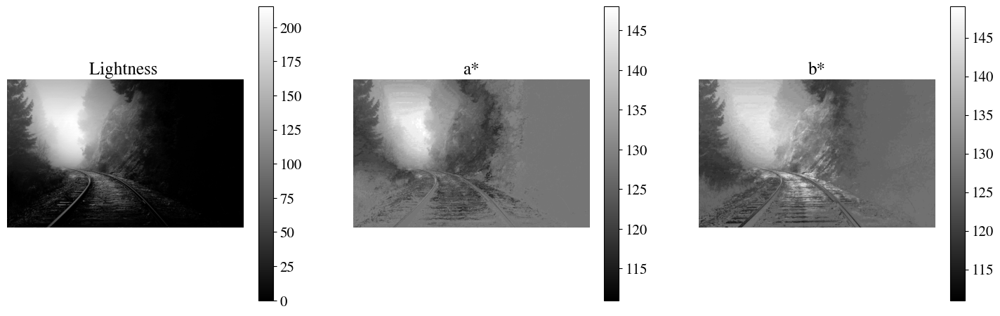

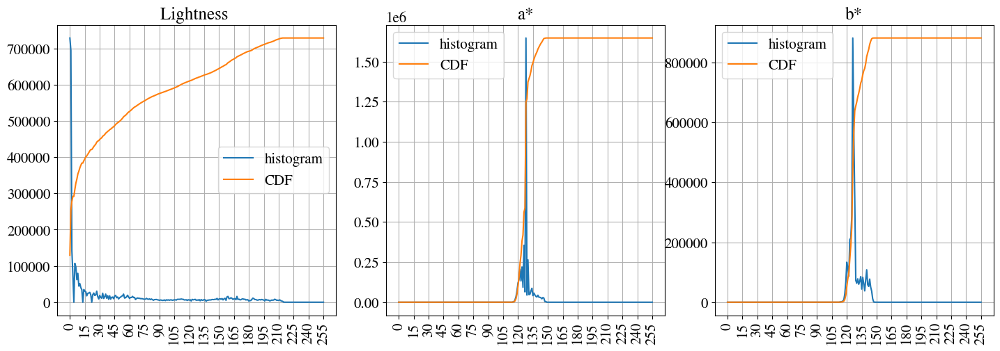

In [56]:
img2_lab = cv2.cvtColor(img2_color_corrected, cv2.COLOR_BGR2LAB)
show_channel_images(img2_lab,["Lightness ","a*","b*"])
plot_channel_histograms(img2_lab,["Lightness ","a*","b*"])

As we can see the dynamic range of the Lightness channel is extremely shifted to dark values on the left. To enchane the dark forest image we can appy histogram equalization on the lightness channel. This method enhances the image by adjusting the pixel values based on the image's histogram on the specified chanel. Specifically we first, calculate the images histogram via the `cv2.calcHist` method for each channel we are intrested in with our `calculate_channel_hist` function.

Having calculated the histograms for the channels we can find the cummulative density function (CDF) using `np.cumsum`. The value at each pixel represents the cumulative sum of the probability of that pixel and all the pixels before it in the histogram. Thus the CDF ranges from 0 to 1.

Utilizing the calcualted CDF, we can apply a transformation function with `cv2.equalizeHist` method. This function maps the original pixel intensity values to new pixel values, such that the output image's histogram is as close to a uniform distribution as possible. The transformation function is computed as follows:

$$
g_{i,j} = \text{floor} \left( (L-1) \sum_{n=0}^{f_{i,j}} p_n \right )
$$

where $g_{i,j}$ is the pixel values at each i,j position of the new image $g$, tranformed from the image $f$. $L$ is the $L$ is the number of possible chennel intensity values, often 256 and $p$ the normalized histogram.
Thus, the transformed image is generated by replacing each pixel in the original image with its corresponding transformed value.


In [57]:
def equalize_hist(img,select_channel = "all",grayscale = False):
  if grayscale:
    img = cv2.equalizeHist(img)
    return img
  else:
    if select_channel == "all":
      img[:,:,0] = cv2.equalizeHist(img[:,:,0])
      img[:,:,1] = cv2.equalizeHist(img[:,:,1])
      img[:,:,2] = cv2.equalizeHist(img[:,:,2])
    elif select_channel == "first":
      img[:,:,0] = cv2.equalizeHist(img[:,:,0])
    elif select_channel == "second":
      img[:,:,1] = cv2.equalizeHist(img[:,:,1])
    elif select_channel == "third":
      img[:,:,2] = cv2.equalizeHist(img[:,:,2])
    else:
      raise ValueError("Invalid parameter")
    return img

We equalize the histogram of the lightness channel with the method explained above


In [58]:
img2_lab_eq = equalize_hist(img2_lab,"first")

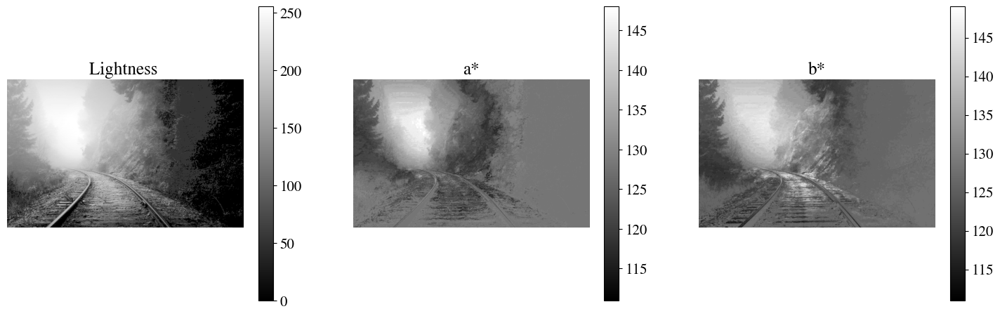

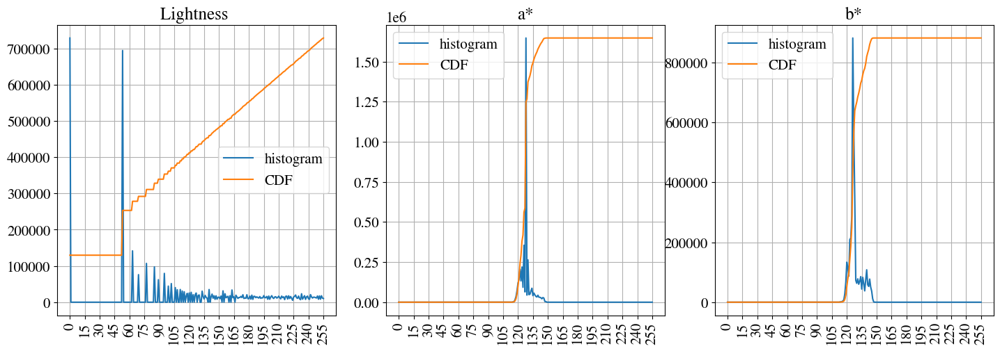

In [59]:
show_channel_images(img2_lab_eq,["Lightness ","a*","b*"])
plot_channel_histograms(img2_lab_eq,["Lightness ","a*","b*"])

Notice how the dynamic range has shifted


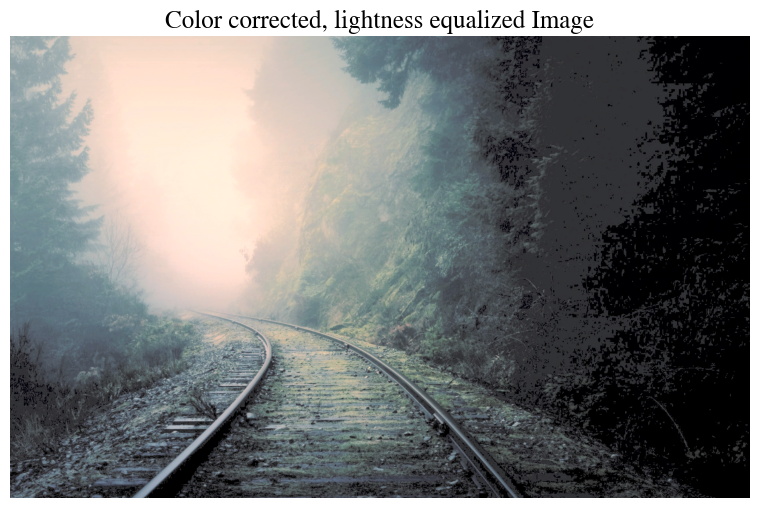

In [60]:
img2_lab_eq_brg = cv2.cvtColor(img2_lab_eq, cv2.COLOR_LAB2BGR)
show_image(img2_lab_eq_brg,"Color corrected, lightness equalized Image")

The overall result provides a much more life-like image, with the exception of the dark pixels on the right side


---
---


# Exercise 3

Propose a method for improving the image `“pollen-500x430px-96dpi.jpg”` in terms the perceived brightness.


## _Solution_

“pollen-500x430px-96dpi.jpg” is an image with equal values of blue, green and red in the BRG color space. Thus its brightness/intensity is represented by the values of the pixels from $0-255$. We load the image, convert it to single channel and present it below.


The original image is in the BRG color space, with shape: (430, 500, 3)
Pixel values are all equal across channels?  True


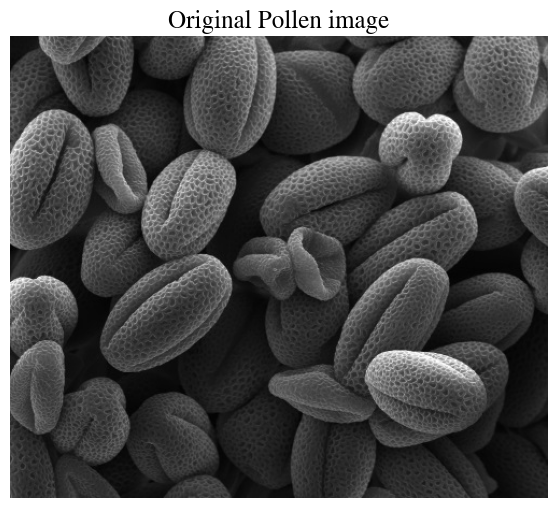

In [61]:
img3 = cv2.imread("pollen-500x430px-96dpi.jpg")
print("The original image is in the BRG color space, with shape:",img3.shape)
print("Pixel values are all equal across channels? ",(img3[:,:,0].all() == img3[:,:,1].all()  == img3[:,:,2].all()))
show_image(img3,"Original Pollen image")

In [62]:
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
print("As you can see the values of each pixel in the BRG channel are equal, thus we convert it to grayscale ",img3_gray.shape)

As you can see the values of each pixel in the BRG channel are equal, thus we convert it to grayscale  (430, 500)


After converting the image to grayscale, we generate a histogram to represent the distribution of pixel brightness values. It is worth noting that the cumulative density function (CDF) exhibits a sharp peak at lower brightness values, indicating that a significant portion of the pixels are assigned with lower values.


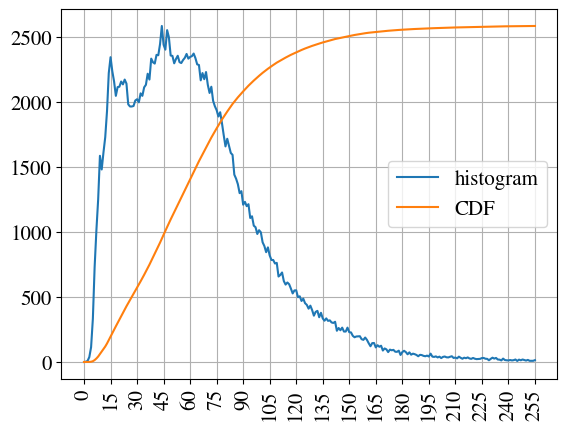

In [63]:
plot_channel_histograms(img3_gray,grayscale=True)

To enchane the Pollen grayscale image in terms of brightness we can appy histogram equalization as explained in the previous exercise


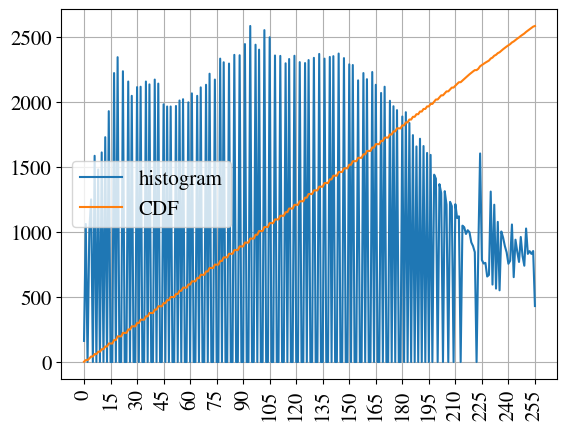

In [64]:
img3_gray = equalize_hist(img3_gray, grayscale = True)
plot_channel_histograms(img3_gray , grayscale=True)

Notice the linear shape of the CDF the the broader dynamic range, the goal of the equalization was achieved.


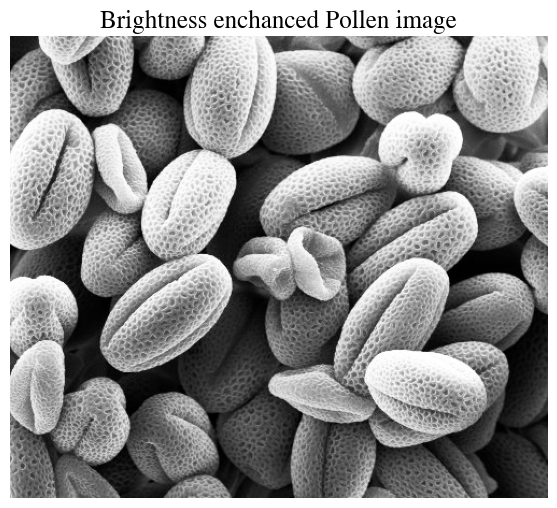

In [65]:
show_image(img3_gray,"Brightness enchanced Pollen image")

---
---


# **Exercise 4**

Propose a method for sharpening the image `“First-photo-of-the-moon-from-Chandrayaan2_ISRO.jpg”`.


##_Solution_


Much like the Pollen image in the previous exercise, the moon image is also grayscale, we load it and present it below:


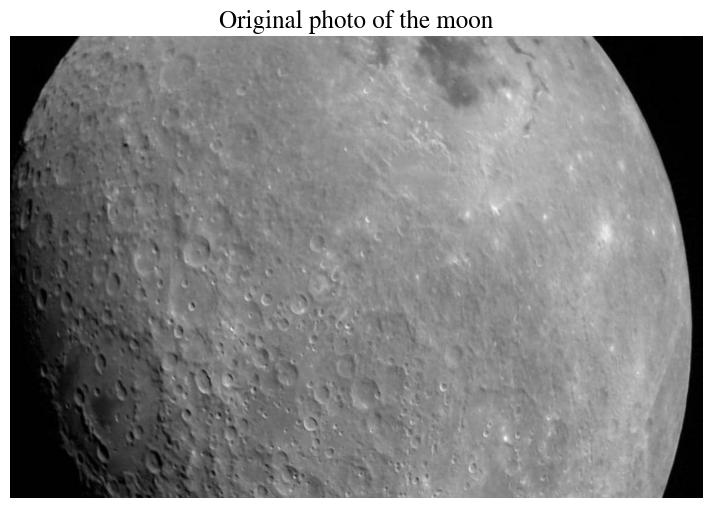

In [66]:
img4 = cv2.imread("First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg")
img4_gray = cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY)
show_image(img4_gray,"Original photo of the moon",grayscale = True)

### Method a)

To achieve this task we can utilize the unsharp Masking method to sharpen the image.

The concept behind unsharp masking involves subtracting a proportionally scaled "unsharp" version of the image from the initial image. To accomplish this effect we can utilize the following unsharp filter.

$$
\frac{1}{α+1} \left[\begin{array}
{rrr}
-α & α-1 & -α \\
α-1 & α+5 & α-1 \\
-α & α-1 & -α
\end{array}\right]
$$

The above filter is a composition of two kernels, "mixed" via α. Its value of alpha determines the proportionally scaled unsharp version of the image that is subtracted from the initial image. The larger the value of alpha, the stronger the sharpening effect applied to the image.

- A kernel used to identidy horizontal and vertical edges:
  $\begin{bmatrix}
-1 & 1 & -1 \\
1 & 1 & 1 \\
-1 & 1 & -1 \\
\end{bmatrix}$

- A Laplacian kernel: $\begin{bmatrix}
0 & -1 & 0 \\
-1 & 5 & -1 \\
0 & -1 & 0 \\
\end{bmatrix}$ utilized to sharpen edges

Finally we code a function to create this filter called `unsharp`and apply it on the original image using the `cv2.filter2D` method.


In [67]:
def unsharp(alpha=0.2):
    #edge detection kernel
    A1 = np.array([[-1,1,-1],[1,1,1],[-1,1,-1]])
    #edge sharpening kernel
    A2 = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
    return (alpha*A1+A2)/(alpha+1)

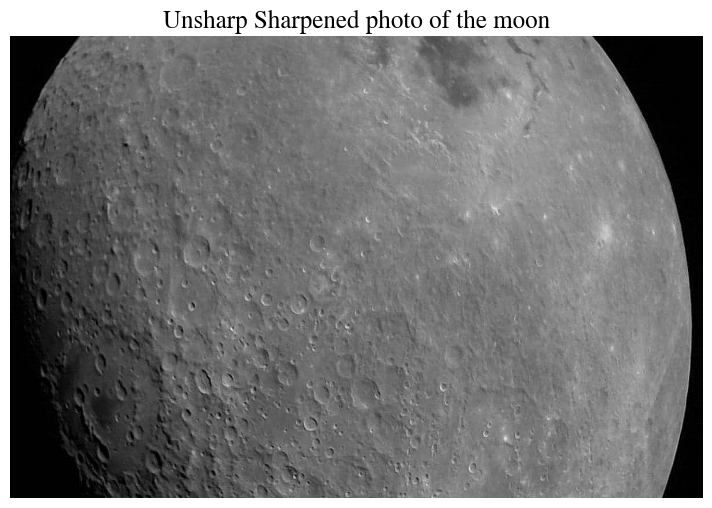

In [68]:
kernel = unsharp(alpha=0.2)
img4_sharpened_v1 = cv2.filter2D(img4_gray, -1, kernel)
show_image(img4_sharpened_v1,"Unsharp Sharpened photo of the moon")

### Method b)

Another way to achieve sharpening is by using a high pass filter:

$$
\text{kernel} = \begin{bmatrix}
-1 & -1 & -1 \\
-1 &  9 & -1 \\
-1 & -1 & -1
\end{bmatrix}.
$$

In filter, the center element has a weight of 9, while the surrounding elements have a weight of -1. This means that the kernel will highlight the central pixel and its immediate neighbors while suppressing the rest of the image. Therefore, it sharpens the image.


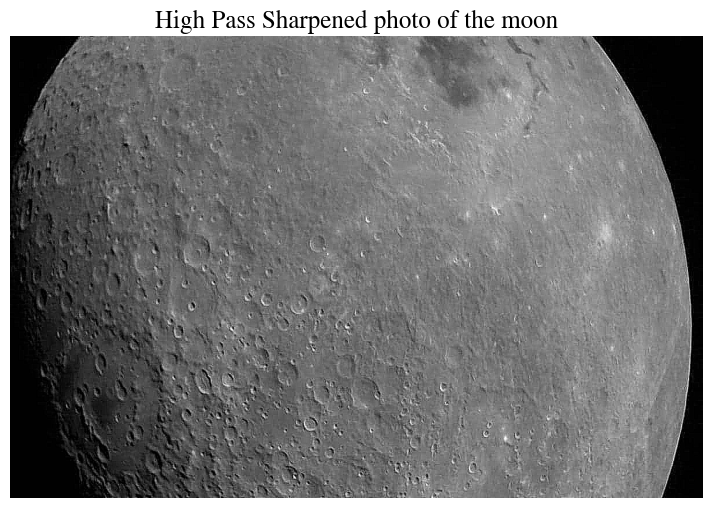

In [69]:
kernel = np.array([[-1, -1, -1],[-1,  9, -1],[-1, -1, -1]])
img4_sharpened_v2 = cv2.filter2D( img4_gray, -1, kernel)
show_image(img4_sharpened_v2,"High Pass Sharpened photo of the moon")

### Result

As we can see the High Pass method amplifies noise too, so we conclude the the result from the unsharp method is a better choice


---
---


# **Exercise 5**

One combined spatial enhancement methods (e.g. arithmetic operations, gray level
transformations, and/or sharpening spatial filters) to convert `“image_1”` to `“image_2”`.

- a) Try to guess the processing steps she adopted. [Note the dynamic range and brightness of
  the enhanced image, and the noise introduced.]
- b) Propose a pipeline of processes with the aim of approximating `“image_1”` starting from
  `“image_2”`.


# _Solution_


Just like in the previous exercises we load the images


In [70]:
img5_start = cv2.imread("image_1.jpg")
img5_goal = cv2.imread("image_2.jpg")
print(img5_goal.shape)
print(img5_start.shape)

(641, 800, 3)
(641, 800, 3)


These are again grayscale images so we convert them to a single channel intensity represenation with `cv2.cvtColor(img5_goal, cv2.COLOR_BGR2GRAY)`:


(641, 800)
(641, 800)


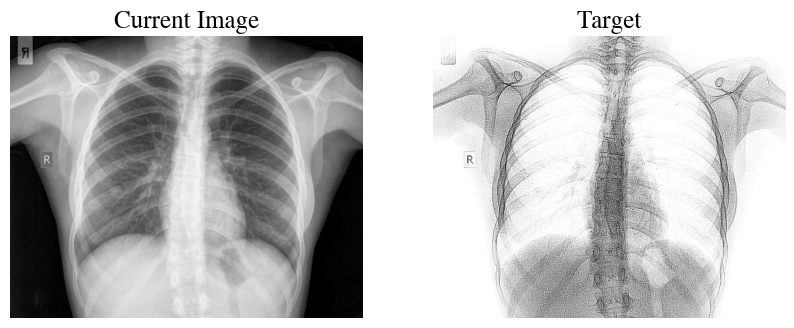

In [71]:
img5_goal = cv2.cvtColor(img5_goal, cv2.COLOR_BGR2GRAY)
img5_start = cv2.cvtColor(img5_start, cv2.COLOR_BGR2GRAY)
print(img5_goal.shape)
print(img5_start.shape)
compare_images(img5_start,img5_goal)

We then plot their respective histograms to check their dynamic range. Notice how the target image has a range extremely shifted to the left (towards very high intensity pixels) while the original iomage is balanced.


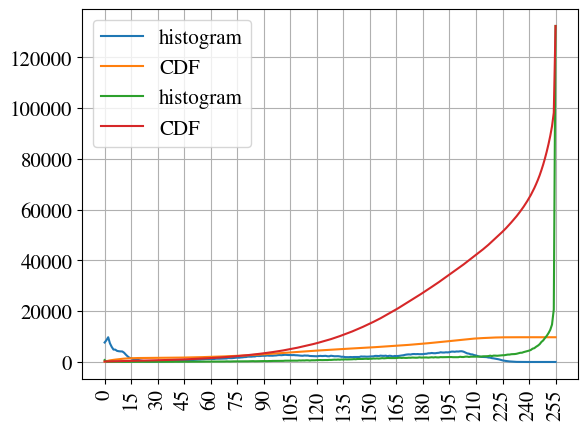

In [72]:
plot_channel_histograms(img5_start,grayscale = True)
plot_channel_histograms(img5_goal,grayscale = True)

###_Solution a)_


It is apparent that the target image is a negative version of the original image. However, simply converting it to a negative image is not the correct step due to the differences in their dynamic ranges, as indicated by the histogram above.

To overcome this challenge, we use gamma correction to darken the original image and shift its intensity values towards 0, thereby achieving a dynamic range that is the opposite of the target image. This process enables us to perform the negative conversion

When the value of gamma is greater than 1, the resulting image after transformation appears lighter compared to the original image. Conversely, if gamma is less than 1, the transformed image appears darker. To obtain a darker image with a dynamic range similar to the opposite of the target image we use a γ value of $0.215$.


In [73]:
def gamma_correction(img, gamma=1.0):
  # create a look-up table of gamma correction values
  inv_gamma = 1.0 / gamma
  table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
  # apply gamma correction using the look-up table
  corrected_img = cv2.LUT(img, table)
  return corrected_img

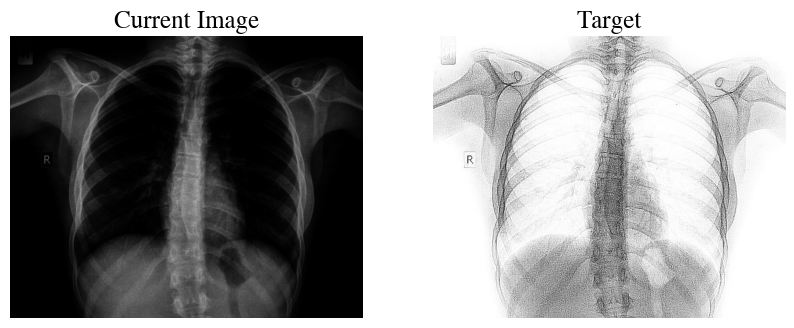

In [74]:
img5_start_gamma_corrected = gamma_correction(img5_start,0.215)
compare_images(img5_start_gamma_corrected,img5_goal,grayscale = "all")

As you can see from the histogram below, the dynamic range of the images is almsot opposite.


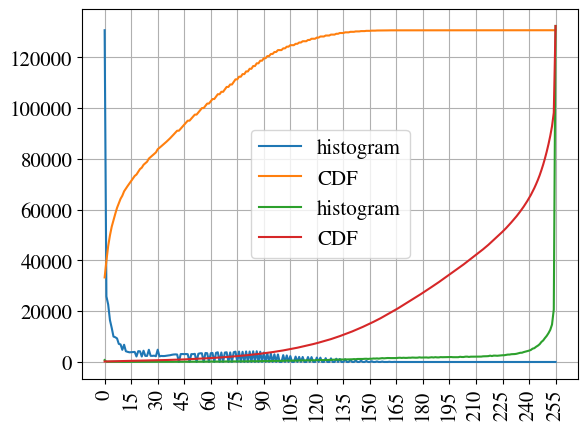

In [75]:
plot_channel_histograms(img5_start_gamma_corrected,grayscale = True)
plot_channel_histograms(img5_goal,grayscale = True)

Now that opposite dynamic range is achieved, it is possible to obtain the negative representation of the original image by subtracting the original image from an image with a uniform intensity value of 255.


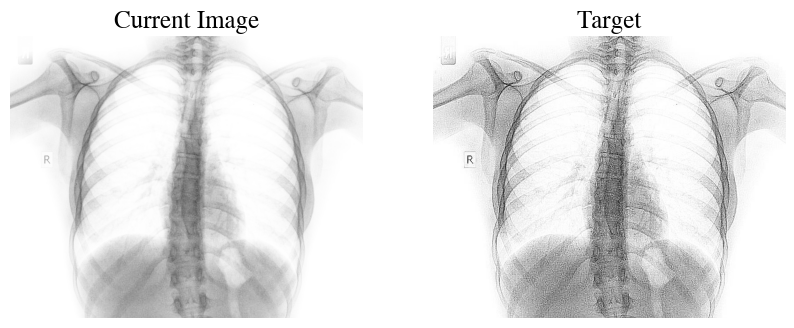

In [76]:
img5_start_gamma_corrected_negative = 255 - img5_start_gamma_corrected
compare_images(img5_start_gamma_corrected_negative,img5_goal,grayscale = "all")

Asa you can see, we are now much closer to the target image.


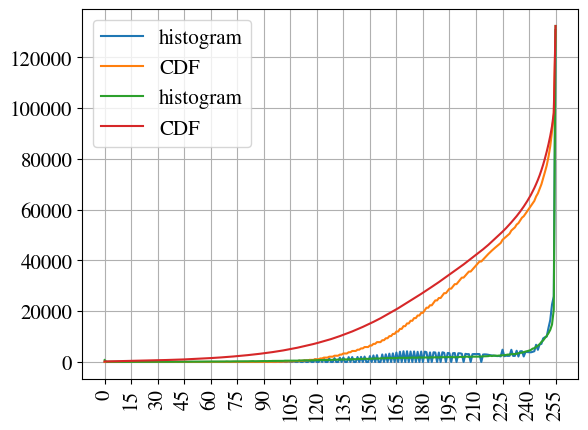

In [77]:
plot_channel_histograms(img5_start_gamma_corrected_negative,grayscale = True)
plot_channel_histograms(img5_goal,grayscale = True)

As you can from the histograms above, low frequency values are weakened and the image has a noisy effect. Remembering our results from method b) in Exercise 4, we utilzie the same high pass filter.

$$
\text{kernel} = \begin{bmatrix}
-1 & -1 & -1 \\
-1 &  9 & -1 \\
-1 & -1 & -1
\end{bmatrix}.
$$


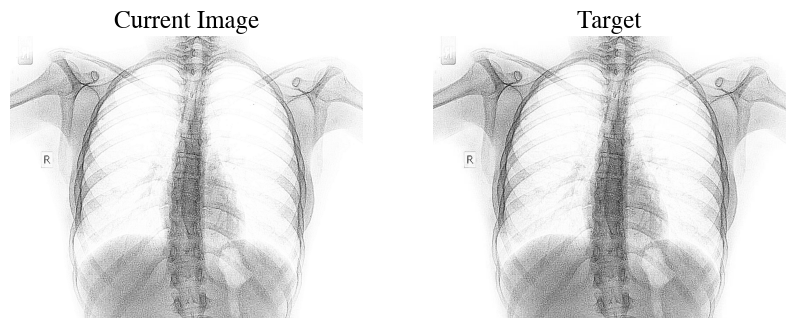

In [78]:
kernel = np.array([[-1, -1, -1],[-1,  9, -1],[-1, -1, -1]])
img5_goal_sharpened= cv2.filter2D(img5_start_gamma_corrected_negative, -1, kernel)
compare_images(img5_goal_sharpened,img5_goal,grayscale = "all")

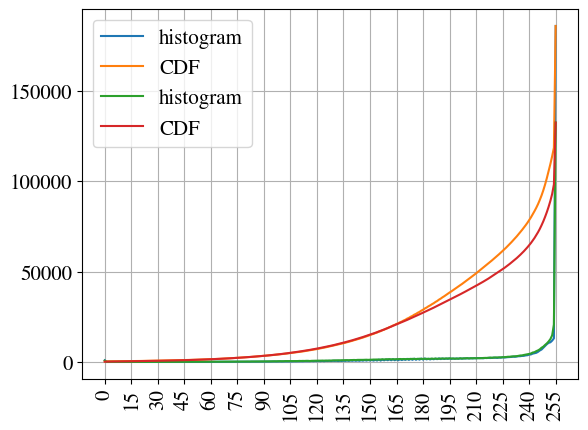

In [79]:
plot_channel_histograms(img5_goal_sharpened,grayscale = True)
plot_channel_histograms(img5_goal,grayscale = True)

### Result

Upon examining the histograms presented above, it becomes evident that our resulting image closely resembles the target image, albeit with one noticeable difference: it contains a greater number of high intensity pixels.


### _Solution b)_


Now we attempt to complete the opposite transformation


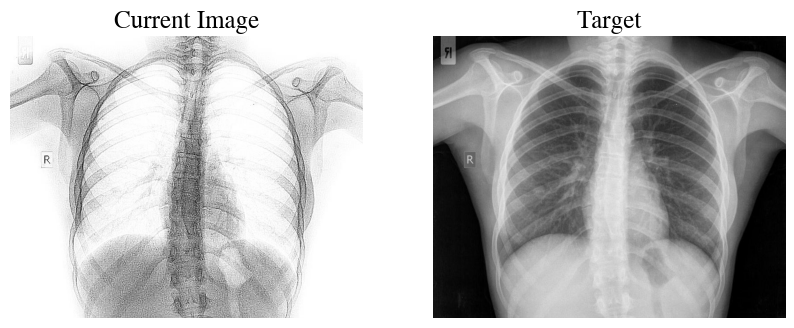

In [80]:
compare_images(img5_goal,img5_start,grayscale = "all")

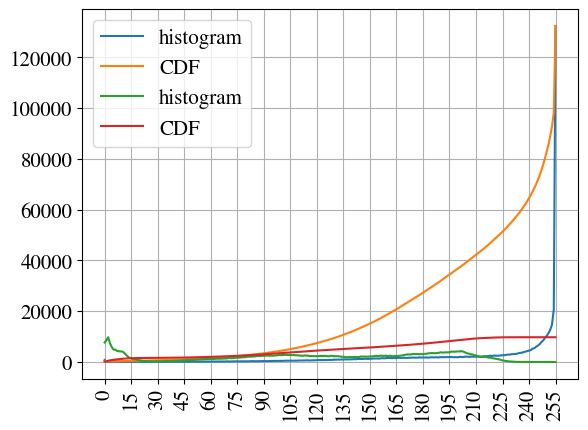

In [81]:
plot_channel_histograms(img5_goal,grayscale = True)
plot_channel_histograms(img5_start, grayscale = True)

We begin by applying GaussianBlur to undo the sharpning and enrich low frequency details


In this case we use 7x7 kenrel matrix. This means that each pixel in the image will be replaced with the average of its surrounding 7x7 pixels.


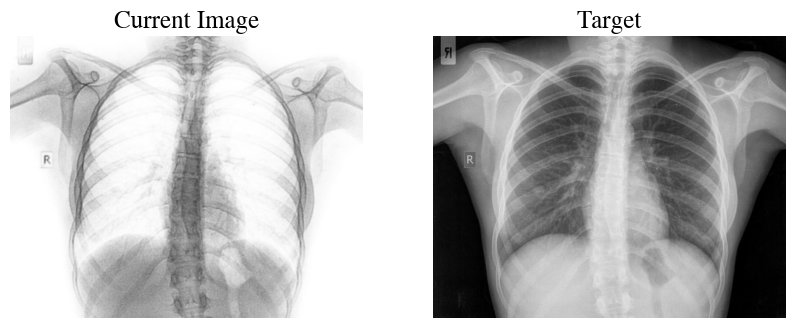

In [82]:
img5_blurred = cv2.GaussianBlur(img5_goal, (7, 7), 0)
compare_images(img5_blurred,img5_start,grayscale = "all")

Then we transform the image to its negative reprsenation as described in a)


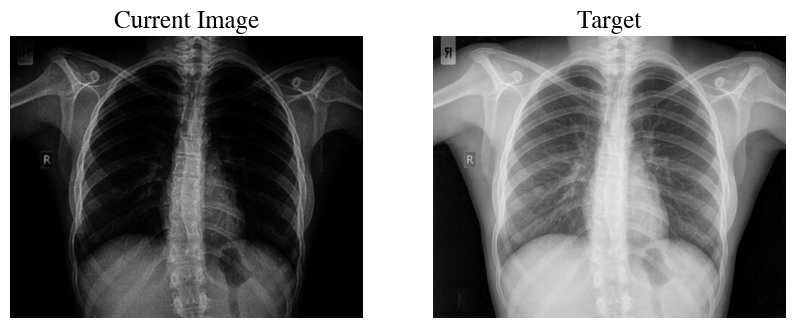

In [83]:
img5_negative = 255 - img5_blurred
compare_images(img5_negative,img5_start,grayscale = "all")

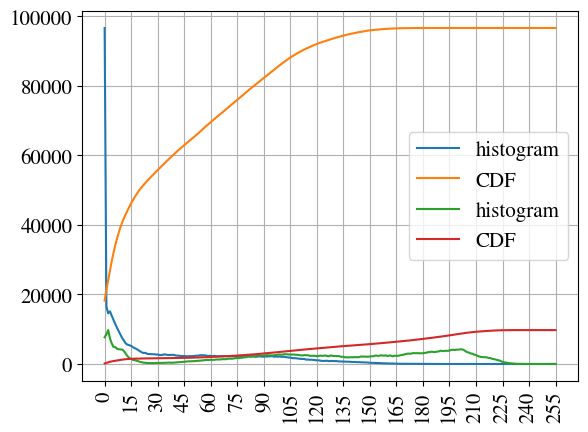

In [84]:
plot_channel_histograms(img5_negative,grayscale = True)
plot_channel_histograms(img5_start, grayscale = True)

The dynamic range of our image is shifted to very low values, thus we apply histogam equalization


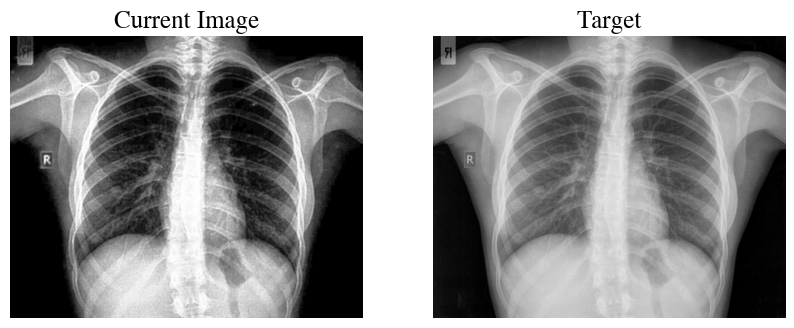

In [85]:
img_negative_eq = cv2.equalizeHist(img5_negative)
compare_images(img_negative_eq,img5_start,grayscale = "all")

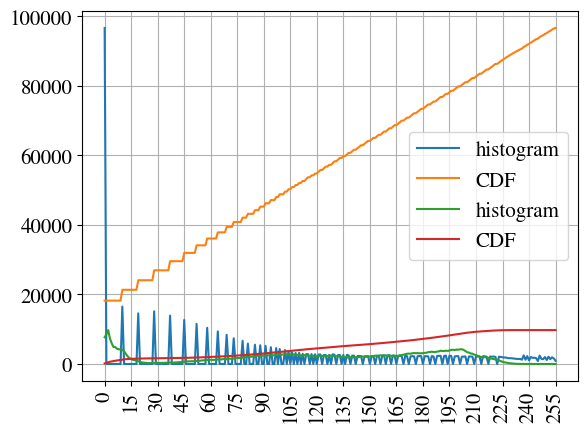

In [86]:
plot_channel_histograms(img_negative_eq,grayscale = True)
plot_channel_histograms(img5_start, grayscale = True)

Finally we sharpen the image


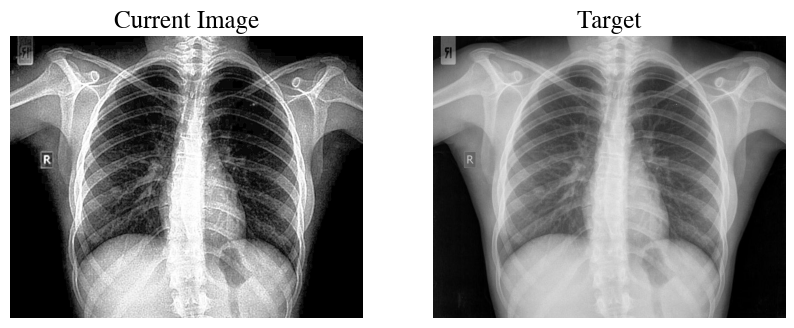

In [87]:
kernel  = unsharp(0.2)
img_negative_eq_sharpened = cv2.filter2D(img_negative_eq, -1, kernel)
compare_images(img_negative_eq_sharpened,img5_start,grayscale = "all")

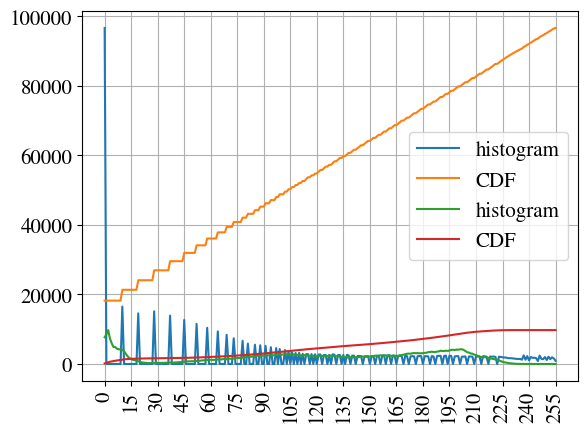

In [88]:
plot_channel_histograms(img_negative_eq,grayscale = True)
plot_channel_histograms(img5_start, grayscale = True)

The process of reversing the transformation has proven to be significantly more challenging than the initial transformation, and unfortunately, the results obtained are not satisfactory.


---
---


# **Exercise 6**

- a. Find the main edges of `image11.jpg`.
- b. Estimate the angle (with respect to the horizontal axis) of the diagonal edges of the roof.
- c. Find the corners of the `image11.jpg`.


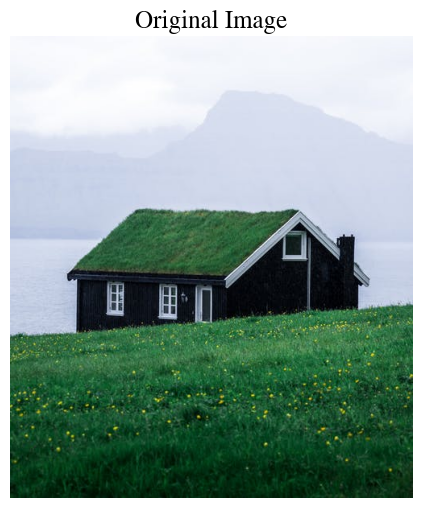

In [89]:
img6 = cv2.imread("image11.jpg")
show_image(img6,"Original Image")

# Solution a)

Before applying any edge detection algorithm, it is recommended to apply a blurring filter to the image in order to reduce noise. One commonly used filter for blurring is the Gaussian blur,which we utilized in exercise 5.


In [90]:
img6_gray = cv2.cvtColor(img6, cv2.COLOR_BGR2GRAY)
img6_gray_blurred = cv2.GaussianBlur(img6_gray, (7, 7), 3)

The Sobel operators is designed to highlight areas of rapid change (gradient) in the intensity of an image and can be used as an edge detection method


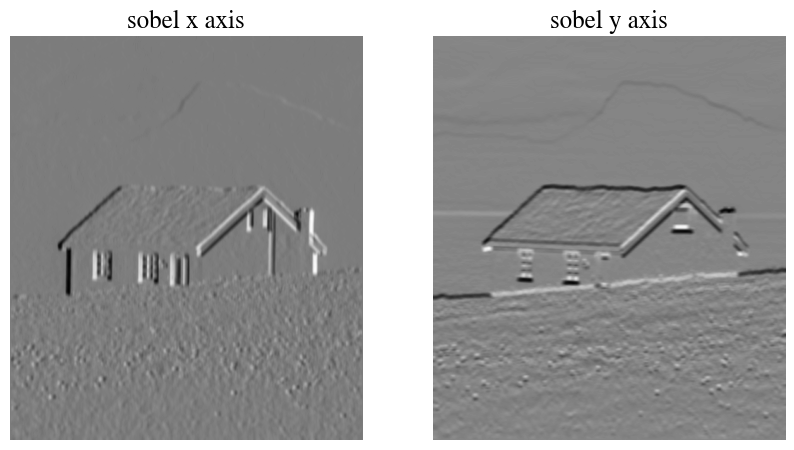

In [91]:
grad_x = cv2.Sobel(img6_gray_blurred, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(img6_gray_blurred, cv2.CV_64F, 0, 1, ksize=3)
compare_images(grad_x,grad_y, titles = ["sobel x axis","sobel y axis"])

However, we can enhance this method by utilizing a more advanced approach, the Canny algorithm.


In addition to blurring and computing gradients in the x and y directions, the Canny algorithm involves the following additional stages:

2. Find the edge gradient magnitude and direction for each pixel
3. Non-maximum Suppression
4. Hysteresis Thresholding


2. We can then be used to determine the edge gradient and direction for each pixel by the following process:

$$\text{Edge Gradient}(G) = \sqrt{G_{x}^{2} + G_{y}^{2}} \qquad \qquad \text{Angle}(\theta) = \tan^{-1} \left(\frac{G_{y}}{G_{x}} \right)$$


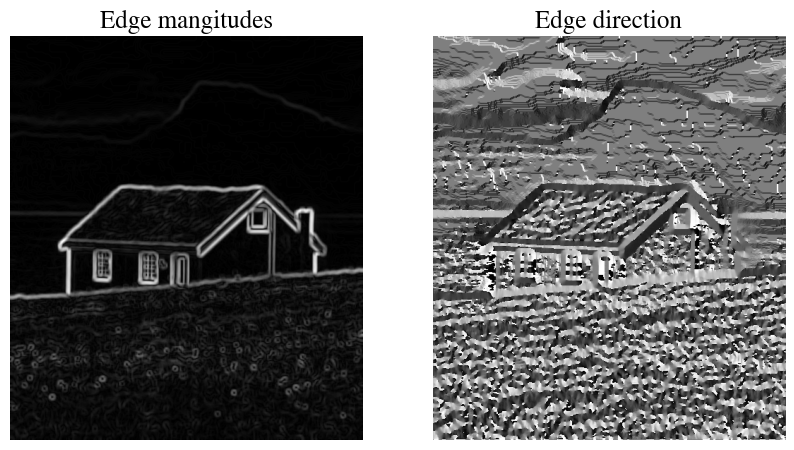

In [92]:
grad_mag = np.sqrt(grad_x ** 2 + grad_y ** 2)
grad_dir = np.arctan2(grad_y, grad_x)
compare_images(grad_mag,grad_dir,["Edge mangitudes","Edge direction"])

3. Non-maximum Suppression: The process involves scanning the entire image and examining each pixel to determine whether it is a local maximum in the direction of the gradient within its neighborhood. If it is its value is retained, if not it is set to 0.

4. Hysteresis Thresholding: At this final stage, the goal is to distinguish true edges from non-edges. Two threshold values, minVal and maxVal are utilzied . Edges with an intensity gradient greater than maxVal are deemed true edges, while those with values below minVal are non-edges. Any edges that fall within these thresholds are assessed based on their connectivity to true edge pixels. If they are connected to such pixels, they are identified as part of an edge. Otherwise, they are discarded as well.

Having explained how the Canny algorithms works we can utilize it via `cv2.Canny` on the blurred grayscale image.


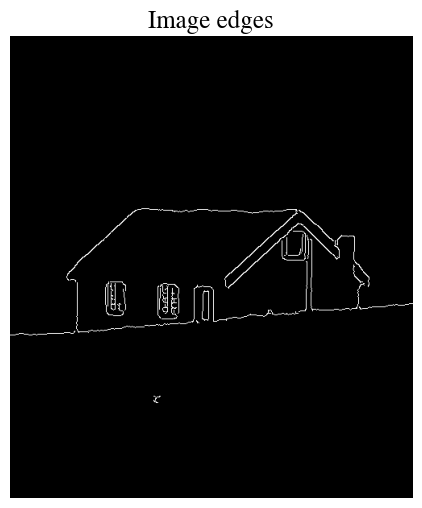

In [93]:
img6_edge = cv2.Canny(img6_gray_blurred,50,150,3)
show_image(img6_edge,"Image edges",grayscale = True)

## _Solution b)_


For this taks we use the The Hough algorithm to detect straight lines.

It use the edge detected image we found from the Canny algorithm and converts it to a binary image using a thresholding algorithm. It then applies the Hough Line Transform to generate lines in the Hough space and calculates their corresponding lines in the image space. The algorithm then filters the lines based on their length and gap between them, returning the filtered set of lines as output.

After collecting the straight lines, we wrap the Hough with a function called `find_lines` that allows us to convert the radians of the lines to degrees and filter out lines with angles that do not land between `deegre_min,degree_max`.

In thise case we suspect the the roof lines will have angles between $40-140$ degrees


In [94]:
def find_lines(image_edges,threshold,deegre_min,degree_max):
    lines = cv2.HoughLines(image_edges, 1, np.pi/180, threshold)

    keep_angles = []
    keep_lines = []
    for line in lines:
        rho, theta = line[0]
        angle = math.degrees(theta)
        if angle< 90:
          angle = 90 - angle
        else:
          angle = 270 - angle
        if angle >= deegre_min and angle <= degree_max:
            keep_angles.append(angle)
            keep_lines.append(line)

    return keep_angles, keep_lines

As you can see 6 lines were filtered and a threshold value of $81$ seemed to return all the needed lines


In [95]:
roof_angles, roof_lines = find_lines(img6_edge,81,40,140)
print(f"{len(roof_lines)} lines found")

6 lines found


We create a function `plot_lines` to plot the identified lines on the image along with their angle degrees.


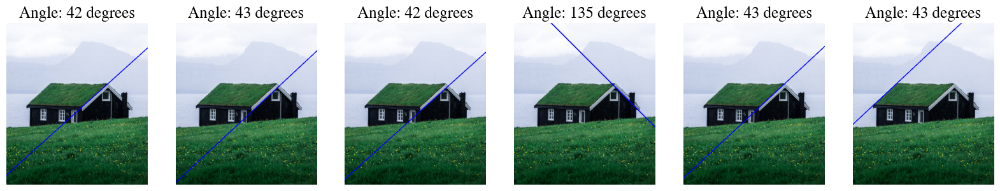

In [96]:
def plot_lines(angles,lines,img):
  counter = 0
  fig, axs = plt.subplots(1,len(angles),figsize = (20,10))
  for line in lines:
      tmp_img = img.copy()
      tmp_img_rgb = cv2.cvtColor(tmp_img, cv2.COLOR_BGR2RGB)

      rho, theta = line[0]
      a = np.cos(theta)
      b = np.sin(theta)
      x0 = a*rho
      y0 = b*rho
      x1 = int(x0 + 1000*(-b))
      y1 = int(y0 + 1000*(a))
      x2 = int(x0 - 1000*(-b))
      y2 = int(y0 - 1000*(a))

      cv2.line(tmp_img_rgb,(x1,y1),(x2,y2),(0,0,255),2)
      axs[counter].imshow(tmp_img_rgb)
      axs[counter].set_title(f"Angle: {round(angles[counter])} degrees")
      axs[counter].axis('off') 
      counter += 1    
  fig.show()

plot_lines(roof_angles,roof_lines,img6)

## Solution c)

To detect the edges of the image we utilize the the Harris corner detection algorithm. The algorithm works by analyzing small local variations in intensity and detecting areas where these variations are significantly different in multiple directions.

Specifically, the algorithm takes an image and computes a "cornerness" measure for each pixel. This measure is based on the gradient of the image, intensity in the x and y directions as presented in solution a) and how this gradient changes when the image is shifted in a small window around the pixel

The `cv2.cornerHarris` method takes as input a grayscale image, the size of neighbourhood considered for corner detection
blockSize - It is the size of neighbourhood considered for corner detection
ksize - Aperture parameter of the Sobel derivative used.
k - Harris detector free parameter in the equation.


In [97]:
img6_corners = cv2.cornerHarris(img6_gray_blurred, 3, 7, 0.04)

To accurately locate the corners, we utilize a threshold and convert the image to binary. Specifically, we only consider corner points whose intensity, as determined by the Harris algorithm, exceeds 5% of the maximum intensity value. This ensures that we only identify corners with a strong enough "corner strength."


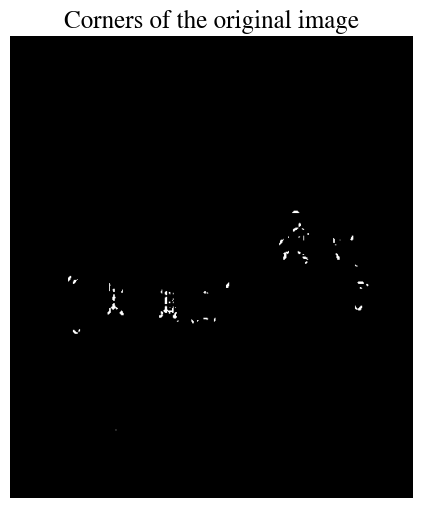

In [99]:
corner_mask = img6_corners > 0.05 * img6_corners.max()
corner_mask = np.where(corner_mask, 255, 0)
corner_mask = np.uint8(corner_mask)
show_image(corner_mask,"Corners of the original image",grayscale = True)

Finally we overlay the corners on the original image creating keypoints for corner points.


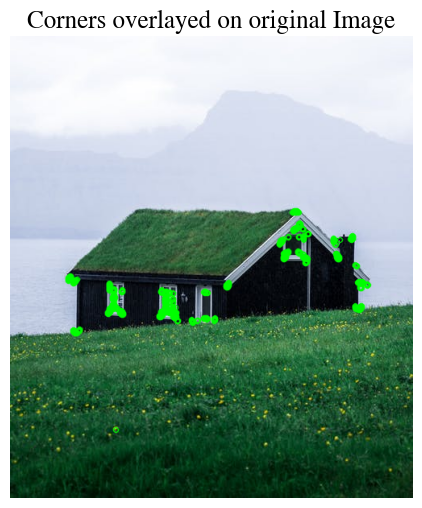

In [100]:
tmp_img = img6.copy()
keypoints = []
for y in range(corner_mask.shape[0]):
    for x in range(corner_mask.shape[1]):
        if corner_mask[y][x] == 255:
            keypoints.append(cv2.KeyPoint(x, y, 1))

# Draw the keypoints on the image
img_with_keypoints = cv2.drawKeypoints(tmp_img, keypoints, None, color=(0, 255, 0))
show_image(img_with_keypoints,"Corners overlayed on original Image")

Finally we overlay the selected corners on the original image


# **Exercise 7**

- a. Estimate the angle with respect to the horizontal axis of the billiard cue in `image31.jpg`. To
  verify your answer, rotate the input image accordingly. The result should be similar to
  `image32.jpg`.
- b. Combine `image31.jpg` and `image32.jpg` to generate an image similar to image 33.jpg.


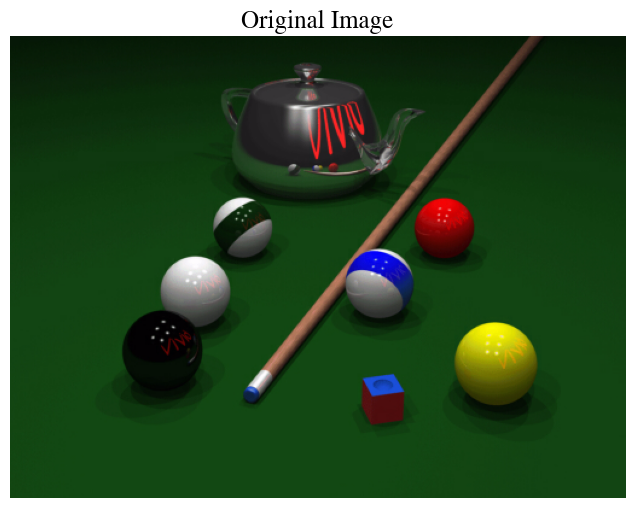

In [111]:
img7_start = cv2.imread("image31.png")
img7_goal = cv2.imread("image32.png")
img7_goalb = cv2.imread("image33.png")
show_image(img7_start,"Original Image")

## _Solution a)_


In this Exercise we will work with the same methods applied in the previous Exercise.

To estimate the angle with respect to the horizontal axis we utilize:

1. The Canny edge detection algorithm to find the edges of the image
2. The Hough algorithm to detect straight lines.


First of all we convert the image to grayscale and blur it to remove noise, as needed for the Canny algorithm


In [112]:
img7_start_gray = cv2.cvtColor(img7_start, cv2.COLOR_BGR2GRAY)
img7_start_gray_blurred = cv2.GaussianBlur(img7_start_gray,(7,7),3)

We can apply the Canny algorithm to detect the edges of the billiard cue. We don't necessarily need to detect all edges; rather, we are only interested in the edges of the cue. Since we are able to detect those edges, we are satisfied with the results.


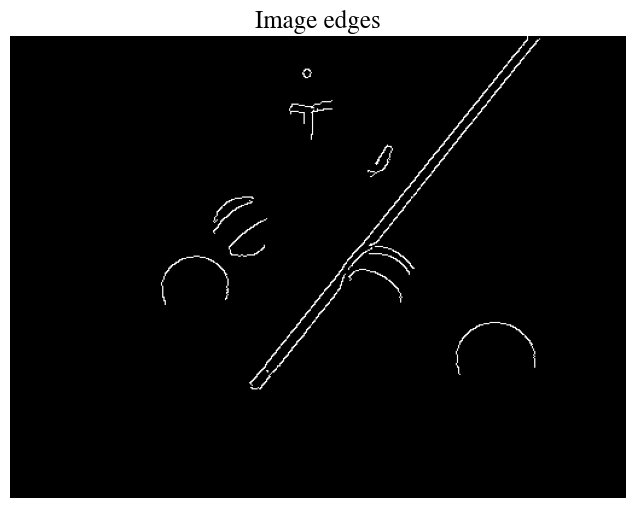

In [113]:
img7_start_edges = cv2.Canny(img7_start_gray_blurred,50,150,3)
show_image(img7_start_edges,"Image edges",grayscale = True)

We have integrated the Hough algorithm into the find_lines function we created for solution 6.b). This enhancement enables us to constrain the detected lines within a specified range.

We suspect that the billiard cue lines have an angle of $60-40$ degrees


In [114]:
billiard_cue_angles,billiard_cue_lines = find_lines(img7_start_edges,160,40,140)
print(f"{len(billiard_cue_lines)} lines found")

2 lines found


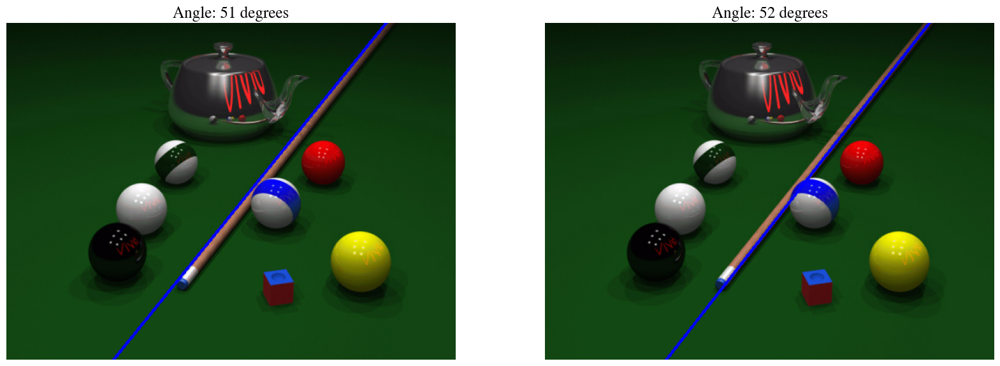

In [115]:
plot_lines(billiard_cue_angles,billiard_cue_lines,img7_start)

Instead of taking the average, we opted to select the line with an angle of 51 degrees as the "correct" one. This decision was based on the fact that the other line corresponds to the shadow cast by the billiard cue, which may not be entirely accurate.


After determining the angle of rotation, we rotate the image using `ndimaga` from the scipy library and present the results. The choosen angle is correct


The angle is: 50.99999891472613


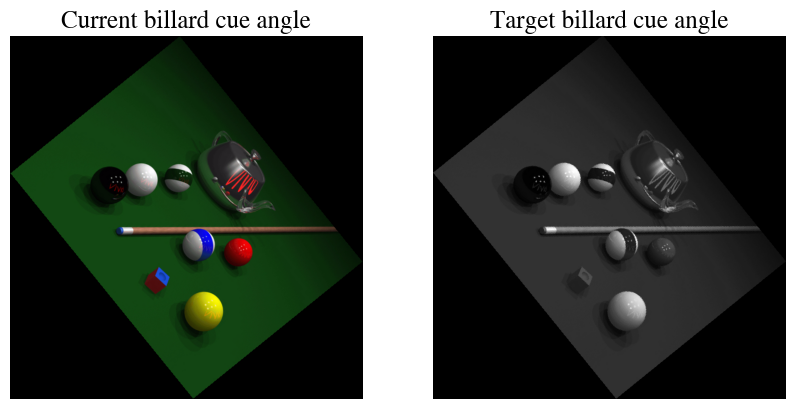

In [116]:
angle = billiard_cue_angles[0] 
print(f"The angle is: {angle}")
img7_start_rotated = ndimage.rotate(img7_start,-angle)
compare_images(img7_start_rotated,img7_goal,["Current billard cue angle","Target billard cue angle"],grayscale = "second")

## _Solution b)_


We need to combine information of the two images below:
As I understand this problem, the phrase "combine the two images" means, that we should utilize the Color information without using the color intensity value from the RGB image, create a mask and add it on the Grayscale image to achieve the final result.


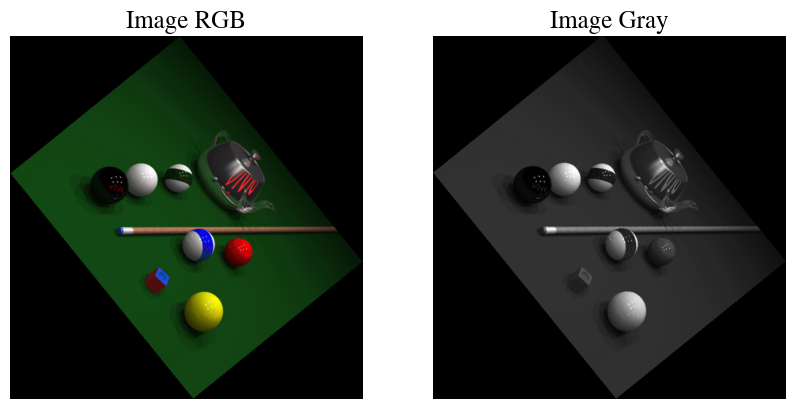

In [117]:
compare_images(img7_start_rotated,img7_goal,["Image RGB","Image Gray"],grayscale = "second")

To reach the following image:


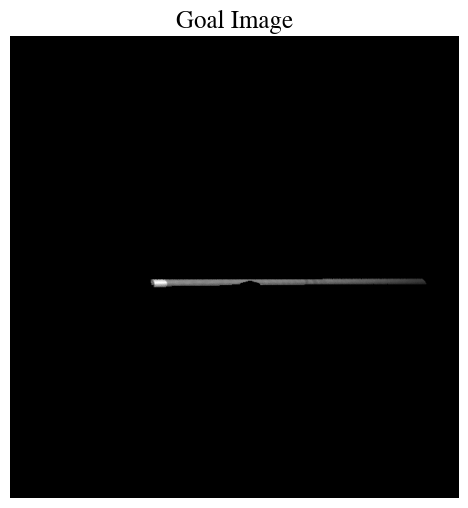

In [118]:
show_image(img7_goalb,"Goal Image",grayscale = True)

This is equivalent to utilizing the Hue and Saturation channels from the (HSV) space to achive this task. The Hue and Saturation channels provide information about the color present in the BGR image, while the Value channel represents the intensity and is the same as the grayscale image.


Thus we blur the image to de-noise and convert it from RGB space to the HSV space and showcase the channels along with their respective histograms


In [250]:
img7_start_rotated_blurred  = cv2.GaussianBlur(img7_start_rotated,(7,7),0)
# img7_start_rotated_blurred = img7_start_rotated

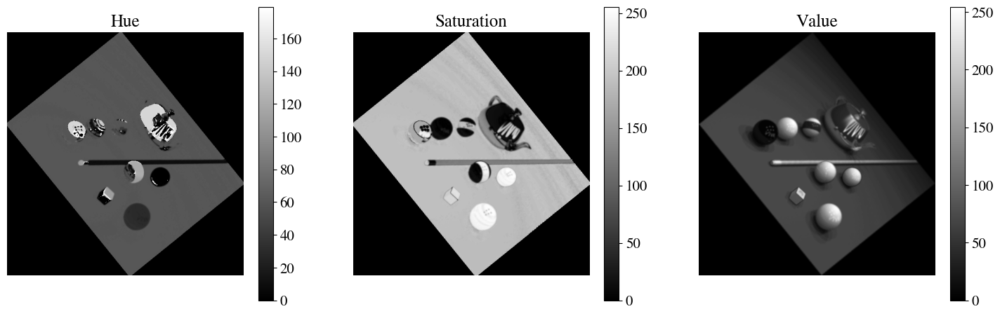

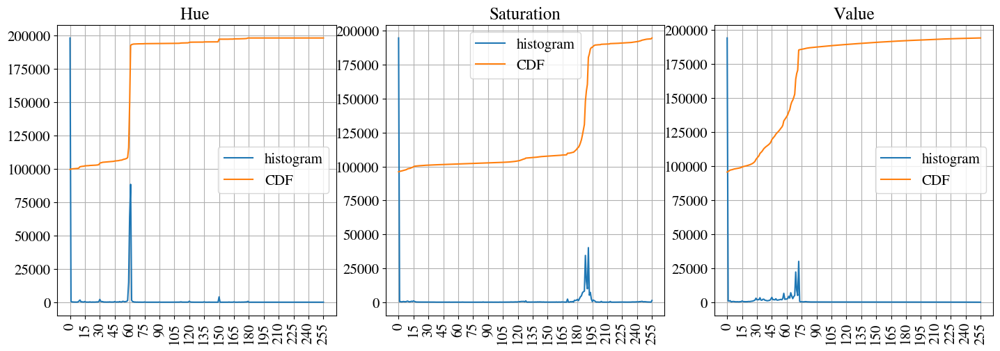

In [251]:
img_hsv = cv2.cvtColor(img7_start_rotated_blurred, cv2.COLOR_BGR2HSV)
show_channel_images(img_hsv,["Hue","Saturation","Value"])
plot_channel_histograms(img_hsv,["Hue ","Saturation","Value"])

we split the image to hue, saturation and value
This way we can use thresholds for each channel to try and isolate the elements of the billiard cue.


In [252]:
hue, saturation, value = cv2.split(img_hsv)

We see the in the Hue channel, the billiard cue has values between 8 and 20, we utilize this information to creat a mask for this channel


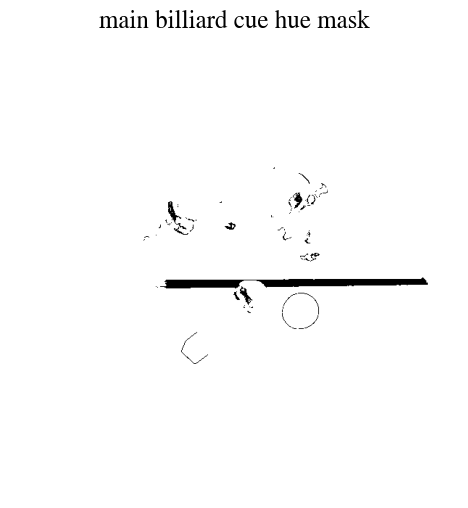

In [268]:
hue_mask = ((hue >= 8) & (hue <= 20))
hue_tmp = np.where(hue_mask,0,255)
show_image(hue_tmp,"main billiard cue hue mask",grayscale = True)

Similarly in the saturation channel the billiard cue has values between 110 and 150.


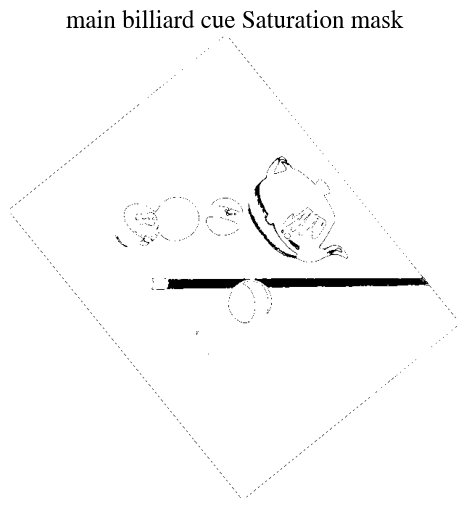

In [273]:
saturation_mask = (saturation > 110) & (saturation < 130)
saturation_tmp = np.where(saturation_mask,0,255)
show_image(saturation_tmp,"main billiard cue Saturation mask",grayscale = True)

We can combine the two filters images to create our final mask for the main billiard cue and eliminate other elements that do not meet the isolation criteria for both channels.


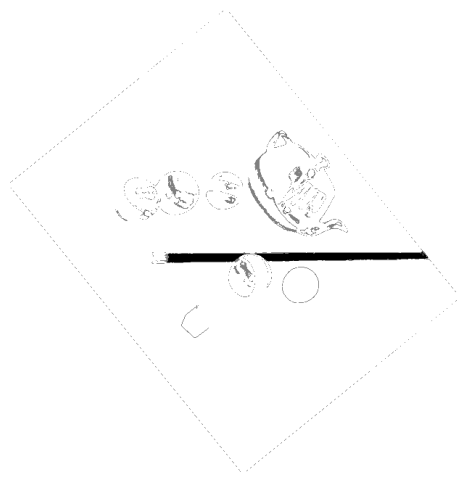

In [274]:
combined_tmp = cv2.addWeighted(saturation_tmp, 1, hue_tmp,1, 1)
show_image(combined_tmp,"",grayscale = True)

We isolate only the black pixels:


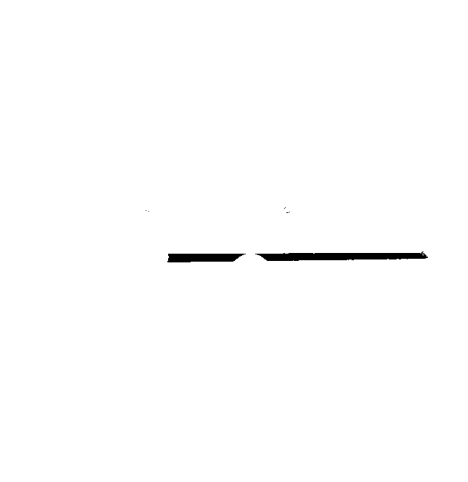

In [275]:
billiard_cue_filter = np.where(combined_tmp <= 1,0,255)
show_image(billiard_cue_filter,"",grayscale = True)

Final we apply the mask that we created from the color space of `image31.png` on `image32.png` (value channel of the HSV represenation of `image31.png` ), isolating the main part of the billiard cue


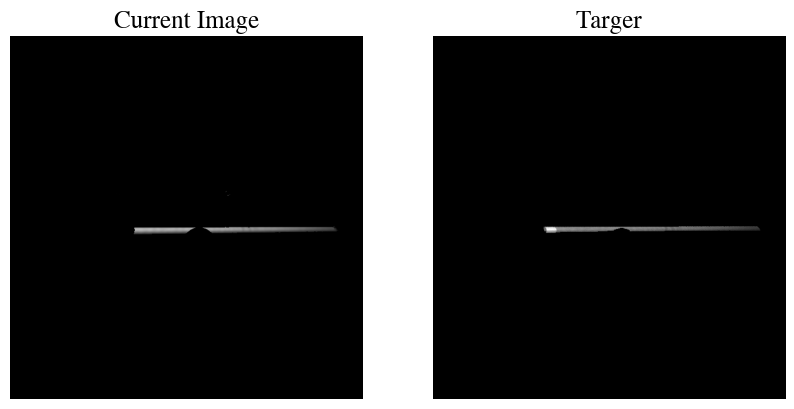

In [280]:
final_value = np.where(combined_tmp <= 1,value,0)
compare_images(final_value,img7_goalb,["Current Image","Targer"],grayscale = "all")

We can apply the same method to isolate the handle of the small front part of the billiard cue and filter it out. To achieve this, we have to also utilize the Value along Saturation channels. By combining the filtered values of these channels, we can isolate the handle from all other elements.
